<a href="https://colab.research.google.com/github/InanSyed/Geospatial-Python/blob/main/Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [61]:
# ─────────────────────────────────────────────────────────────
#  Volcano & City Data ‑‑ Safe Loader
# ─────────────────────────────────────────────────────────────
import os
import geopandas as gpd
from pathlib import Path
from IPython.display import display

# ---------- Config ----------
DATA_DIR = Path("data")                   # project‑relative data folder
VOLCANO_SHP = DATA_DIR / "Global_2013_HoloceneVolcanoes_SmithsonianVOTW" / "Smithsonian_VOTW_Holocene_VolcanoesPoint.shp"
CITIES_SHP  = DATA_DIR / "ne_10m_populated_places" / "ne_10m_populated_places.shp"

# ---------- Helper ----------
def load_layer(path: Path, layer_name: str) -> gpd.GeoDataFrame:
    """
    Safely load a shapefile/GeoPackage into a GeoDataFrame.

    Parameters
    ----------
    path : Path
        Full path to the .shp / .gpkg / etc.
    layer_name : str
        Friendly name used in log messages.

    Returns
    -------
    gpd.GeoDataFrame
    """
    if not path.exists():
        raise FileNotFoundError(
            f"\n{layer_name} not found at {path}\n"
            f"    → Make sure you extracted the dataset exactly as described.\n"
        )
    gdf = gpd.read_file(path)
    if gdf.empty:
        raise ValueError(f"{layer_name} loaded but is empty!")

    # Quick geometry sanity (drop empties, warn on mixed types)
    gdf = gdf[~gdf.geometry.is_empty & gdf.geometry.notnull()]
    geom_types = gdf.geom_type.unique()
    if len(geom_types) > 1:
        print(f"{layer_name} has multiple geometry types: {geom_types}")
    return gdf


# ---------- Load datasets ----------
volcanoes = load_layer(VOLCANO_SHP, "Holocene Volcanoes")
cities    = load_layer(CITIES_SHP,  "Populated Places (Natural Earth)")

# ---------- Quick overview ----------
def inspect(gdf, name):
    print(f"\n{name}:")
    print(f"  • Records : {len(gdf):,}")
    print(f"  • CRS      : {gdf.crs}")
    print(f"  • Columns  : {list(gdf.columns)[:10]} ...")  # show first few cols
    print(f"  • Sample data:")
    display(gdf.head(3))

inspect(volcanoes, "Volcano layer")
inspect(cities,    "Cities layer")


Volcano layer:
  • Records : 1,422
  • CRS      : EPSG:4326
  • Columns  : ['Volcano_Nu', 'Volcano_Na', 'Primary_Vo', 'Last_Erupt', 'Country', 'Geological', 'Region', 'Subregion', 'Latitude', 'Longitude'] ...
  • Sample data:


,Volcano_Nu,Volcano_Na,Primary_Vo,Last_Erupt,Country,Geological,Region,Subregion,Latitude,Longitude,Elevation,Tectonic_S,Geologic_E,Evidence_C,Primary_Ph,Primary_P0,Primary_P1,Major_Rock,geometry
0,210010,West Eifel Volcanic Field,Maar(s),"-8,300",Germany,The West Eifel Volcanic Field of western Germa...,Mediterranean and Western Asia,Western Europe,50,7,600,Rift zone / Continental crust (> 25 km),Holocene,Eruption Dated,https://volcano.si.edu/photos/full/015001.jpg,The lake-filled Weinfelder maar is one of abou...,"Photo by Richard Waitt, 1990 (U.S. Geological ...",Foidite,POINT (6.85 50.17)
1,210020,Chaine des Puys,Lava dome(s),"-4,040",France,"The Chaîne des Puys, prominent in the history ...",Mediterranean and Western Asia,Western Europe,46,3,1464,Rift zone / Continental crust (> 25 km),Holocene,Eruption Dated,https://volcano.si.edu/photos/full/088002.jpg,The central part of the Chaîne des Puys volcan...,Photo by Ichio Moriya (Kanazawa University).,Basalt / Picro-Basalt,POINT (2.97 45.775)
2,210030,Olot Volcanic Field,Pyroclastic cone(s),NaN,Spain,The Olot volcanic field (also known as the Gar...,Mediterranean and Western Asia,Western Europe,42,3,893,Intraplate / Continental crust (> 25 km),Holocene,Evidence Credible,https://volcano.si.edu/photos/full/119091.jpg,The forested Volcà Montolivet scoria cone rise...,Photo by Puigalder (Wikimedia Commons).,Trachybasalt / Tephrite Basanite,POINT (2.53 42.17)



Cities layer:
  • Records : 7,342
  • CRS      : EPSG:4326
  • Columns  : ['SCALERANK', 'NATSCALE', 'LABELRANK', 'FEATURECLA', 'NAME', 'NAMEPAR', 'NAMEALT', 'NAMEASCII', 'ADM0CAP', 'CAPIN'] ...
  • Sample data:


,SCALERANK,NATSCALE,LABELRANK,FEATURECLA,NAME,NAMEPAR,NAMEALT,NAMEASCII,ADM0CAP,CAPIN,...,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,FCLASS_TLC,geometry
0,10,1,8,Admin-1 capital,Colonia del Sacramento,None,None,Colonia del Sacramento,0,None,...,None,None,None,None,None,None,None,None,None,POINT (-57.83612 -34.46979)
1,10,1,8,Admin-1 capital,Trinidad,None,None,Trinidad,0,None,...,None,None,None,None,None,None,None,None,None,POINT (-56.901 -33.544)
2,10,1,8,Admin-1 capital,Fray Bentos,None,None,Fray Bentos,0,None,...,None,None,None,None,None,None,None,None,None,POINT (-58.304 -33.139)


In [62]:
# ─────────────────────────────────────────────────────────────
#  Re‑projection  ➜  Metric CRS  (EPSG:3857)
# ─────────────────────────────────────────────────────────────
volcanoes_merc = volcanoes.to_crs(epsg=3857)
cities_merc    = cities.to_crs(volcanoes_merc.crs)

print(f"Re‑projected: volcanoes now at {volcanoes_merc.crs}, cities match.")

Re‑projected: volcanoes now at EPSG:3857, cities match.


In [63]:
# ─────────────────────────────────────────────────────────────
#  Filter cities by population  > 100 000
# ─────────────────────────────────────────────────────────────
# Natural Earth has two main pop fields:  POP_MAX (metro) and POP_MIN (city proper).
# We'll use POP_MAX so we don't under‑estimate very large metro ares.
cities_100k = (
    cities_merc
    .loc[cities_merc["POP_MAX"].fillna(0) > 100_000]   # fill NaNs with 0 just in case
    .copy()
)

print(f"Cities >100k  : {len(cities_100k):,} out of {len(cities_merc):,}")

display(cities_100k[["NAME", "ADM0NAME", "POP_MAX"]].head())

Cities >100k  : 3,085 out of 7,342


,NAME,ADM0NAME,POP_MAX
18,Tây Ninh,Vietnam,126370
21,Lạng Sơn,Vietnam,148000
26,Thái Bình,Vietnam,210000
28,Thu Dau Mot,Vietnam,244277
30,Cao Lãnh,Vietnam,149837


In [64]:
# ─────────────────────────────────────────────────────────────
#  Buffer volcanos 100 km  ➜  find cities “at‑risk”
# ─────────────────────────────────────────────────────────────
BUFFER_KM   = 100
BUFFER_MET  = BUFFER_KM * 1_000     # 100 000 m
print(f"▶︎ Buffering {len(volcanoes_merc):,} volcano points by {BUFFER_KM} km …")

# Create buffer polygons (a GeoSeries is fine, but we’ll wrap into a new GDF)
volc_buf = volcanoes_merc.copy()
volc_buf["geometry"] = volcanoes_merc.geometry.buffer(BUFFER_MET)

# Spatial join: which of the 3 085 big cities fall w/in any buffer poly?
at_risk = gpd.sjoin(
    cities_100k,          # left
    volc_buf[["geometry"]],  # right (only need geom col)
    how="inner",
    predicate="within"    # point is inside polygon
).drop_duplicates(subset="NAME")     # in case a city hits 2+ overlapping buffers





▶︎ Buffering 1,422 volcano points by 100 km …


In [65]:
# -----------------------------------------------------------------
#  Summaries
# -----------------------------------------------------------------
n_at_risk = len(at_risk)
pct       = n_at_risk / len(cities_100k) * 100
pop_sum   = at_risk["POP_MAX"].sum()

print(f"At‑risk cities : {n_at_risk:,}  ({pct:0.1f}% of >100k sample)")
print(f"Total pop.     : {pop_sum:,.0f}")

# Top‑10 biggest at‑risk cities (for bar‑chart later)
top10 = (at_risk
         .nlargest(10, "POP_MAX")
         .loc[:, ["NAME", "ADM0NAME", "POP_MAX"]]
         .assign(POP_MILL=lambda df: df["POP_MAX"] / 1_000_000)
         .reset_index(drop=True))

print("\nTop‑10 at‑risk cities (pop. millions):")
display(top10)

At‑risk cities : 333  (10.8% of >100k sample)
Total pop.     : 234,451,957

Top‑10 at‑risk cities (pop. millions):


,NAME,ADM0NAME,POP_MAX,POP_MILL
0,Mexico City,Mexico,19028000,19
1,Manila,Philippines,11100000,11
2,Jakarta,Indonesia,9125000,9
3,Tehran,Iran,7873000,8
4,Taipei,Taiwan,6900273,7
5,Santiago,Chile,5720000,6
6,Ho Chi Minh City,Vietnam,5314000,5
7,New Taipei,Taiwan,3893740,4
8,Yokohama,Japan,3697894,4
9,Rome,Italy,3339000,3


In [54]:
# ─────────────────────────────────────────────────────────────
#  Load Natural Earth Admin‑0 countries  (1:50 m)
# ─────────────────────────────────────────────────────────────
COUNTRIES_SHP = DATA_DIR / "ne_50m_admin_0_countries" / "ne_50m_admin_0_countries.shp"

if not COUNTRIES_SHP.exists():
    raise FileNotFoundError(
        f"Could not locate {COUNTRIES_SHP}. Make sure the countries zip "
        f"was un‑zipped into data/ne_50m_admin_0_countries/ ."
    )

world = gpd.read_file(COUNTRIES_SHP).to_crs(volcanoes_merc.crs)
print(f"Loaded Admin‑0 countries ({len(world):,} polygons) – CRS match: {world.crs == volcanoes_merc.crs}")


Loaded Admin‑0 countries (242 polygons) – CRS match: True


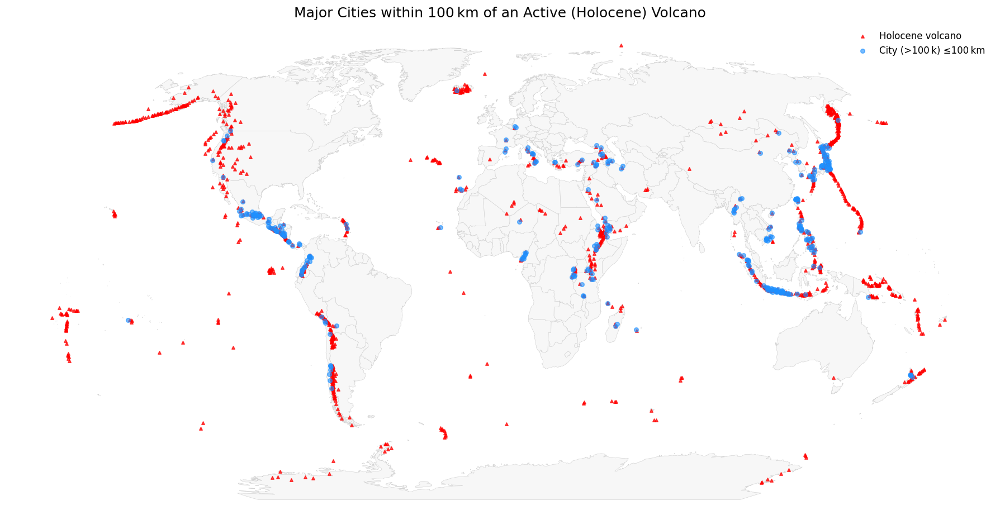

In [53]:
# ─────────────────────────────────────────────────────────────
#  Robinson projection (fallback‑safe)
# ─────────────────────────────────────────────────────────────
import pyproj
import geopandas as gpd
import matplotlib.pyplot as plt

ROB = "ESRI:54030"

world_robin  = world.to_crs(ROB)
volcs_robin  = volcanoes_merc.to_crs(ROB)
cities_robin = at_risk.to_crs(ROB)

# ------------- plot -------------
fig, ax = plt.subplots(figsize=(16, 8), dpi=120)

world_robin.plot(ax=ax,
                 color="#f7f7f7",
                 edgecolor="lightgray",
                 linewidth=0.4)

volcs_robin.plot(ax=ax,
                 marker="^",
                 markersize=10,
                 color="red",
                 alpha=0.7,
                 label="Holocene volcano")

cities_robin.plot(ax=ax,
                  marker="o",
                  markersize=20,
                  color="dodgerblue",
                  alpha=0.6,
                  label="City (>100 k) ≤100 km")

ax.set_title("Major Cities within 100 km of an Active (Holocene) Volcano",
             fontsize=15)
ax.legend(frameon=False)
ax.set_axis_off()
plt.tight_layout()
plt.show()


In [52]:
# ─────────────────────────────────────────────────────────────
#  Folium interactive map  – volcanoes • tiered rings • cities
# ─────────────────────────────────────────────────────────────
import folium
from shapely.geometry import mapping   # converts geom → GeoJSON

rings_wgs  = hazard_rings.to_crs(4326)
cities_wgs = cities_tiered.to_crs(4326)

m = folium.Map(location=[0, 0], zoom_start=2, tiles="CartoDB positron")

# ---------- Volcano vents ----------
volc_layer = folium.FeatureGroup(name="Volcanoes")
for _, r in volcanoes.iterrows():
    folium.CircleMarker(
        [r.Latitude, r.Longitude], radius=2,
        color="black", fill=True, fill_opacity=1,
        tooltip=r.Volcano_Na
    ).add_to(volc_layer)
m.add_child(volc_layer)

# ---------- Hazard rings ----------
def style_ring(feat):
    hz = feat["properties"]["hazard"]
    return {"color": COLOR[hz], "weight": 0,
            "fillColor": COLOR[hz], "fillOpacity": 0.25}

for _, r in rings_wgs.iterrows():
    feat = {
        "type": "Feature",
        "geometry": mapping(r.geometry),
        "properties": {"hazard": r.hazard}
    }
    pop = tier_tbl.loc[r.hazard, "Pop"]
    folium.GeoJson(
        feat, style_function=style_ring,
        tooltip=f"{r.hazard} ring • Pop: {pop}"
    ).add_to(m)

# ---------- Cities coloured by tier ----------
city_layer = folium.FeatureGroup(name="Cities (>100 k)")
for _, r in cities_wgs.iterrows():
    folium.CircleMarker(
        [r.geometry.y, r.geometry.x], radius=4,
        color=COLOR[r.hazard], fill=True, fill_opacity=.7,
        tooltip=f"{r.NAME} ({int(r.POP_MAX):,}) – {r.hazard}"
    ).add_to(city_layer)
m.add_child(city_layer)


folium.LayerControl().add_to(m)

# ---------- Add custom legend (Folium + branca) ----------
from branca.element import Template, MacroElement

legend_html = f"""
{{% macro html(this, kwargs) %}}   <!-- required macro signature -->
<style>
  .volc-legend {{
    position: fixed;
    bottom: 15px; right: 15px;
    z-index: 9999;
    background: rgba(255,255,255,0.9);
    padding: 8px 12px;
    border-radius: 4px;
    box-shadow: 0 0 6px rgba(0,0,0,0.3);
    font-size: 12px;
    line-height: 18px;
  }}
  .volc-legend i {{
    width: 12px; height: 12px;
    float: left; margin-right: 6px;
    opacity: 0.8;
  }}
</style>

<div class="volc-legend">
  <div><i style="background:black"></i> Volcano vent</div>
  <div><i style="background:{COLOR['High']}"></i> High&nbsp;(≤10 km)</div>
  <div><i style="background:{COLOR['Med‑High']}"></i> Med‑High&nbsp;(10–30 km)</div>
  <div><i style="background:{COLOR['Medium']}"></i> Medium&nbsp;(30–50 km)</div>
  <div><i style="background:{COLOR['Low']}"></i> Low&nbsp;(50–100 km)</div>
  <div><i style="background:dodgerblue"></i> City &gt;100 k</div>
</div>
{{% endmacro %}}
"""

legend = MacroElement()
legend._template = Template(legend_html)
m.get_root().add_child(legend)

# display the map
display(m)


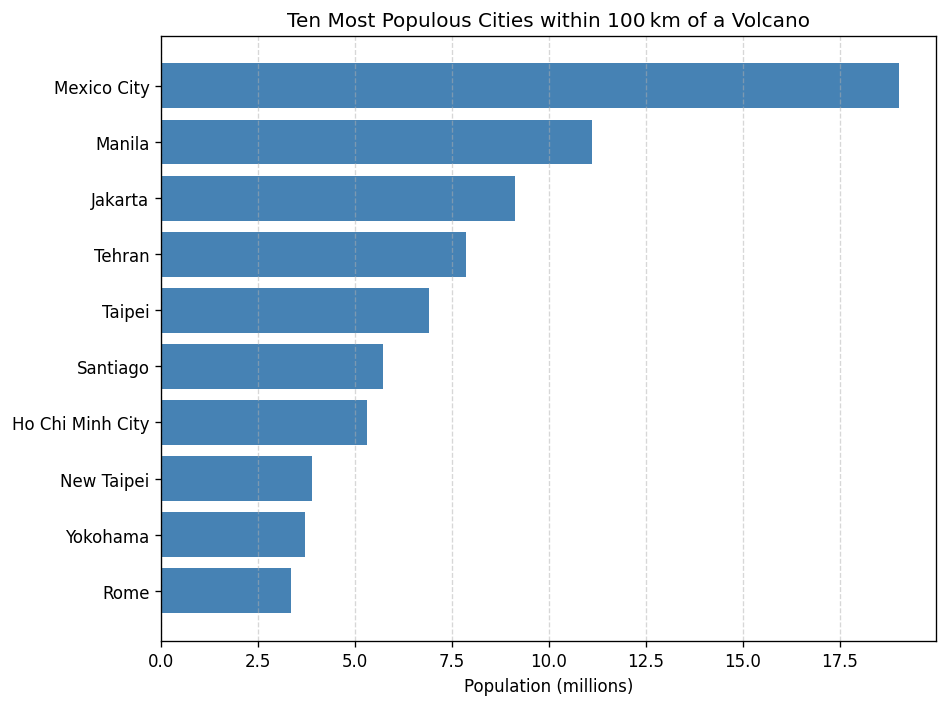

In [36]:
# ─────────────────────────────────────────────────────────────
#  Top‑10 bar char
# ─────────────────────────────────────────────────────────────
plt.figure(figsize=(8, 6))
top10_sorted = top10.sort_values("POP_MAX")   # ascending for horiz. bar
plt.barh(top10_sorted["NAME"], top10_sorted["POP_MAX"] / 1_000_000, color="steelblue")
plt.xlabel("Population (millions)")
plt.title("Ten Most Populous Cities within 100 km of a Volcano")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()
